### Notebook for the label transfer of WT mice to genotypes with `scANVI`

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology - Faculty of Medicine - Julius-Maximilian-Universität Würzburg**
- v230829

### Import required modules

In [1]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import plotnine as p
from pywaffle import Waffle
import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                 10.2.0
absl                NA
asttokens           NA
attr                23.2.0
chex                0.1.85
comm                0.2.1
contextlib2         NA
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.8.1
decorator           5.1.1
docrep              0.3.2
etils               1.7.0
executing           2.0.1
flax                0.8.1
fsspec              2024.2.0
h5py                3.10.0
igraph              0.11.4
importlib_resources NA
ipykernel           6.29.2
ipywidgets          8.1.2
jax                 0.4.19
jaxlib              0.4.19
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
lightning           2.1.4
lightning_utilities 0.10.1
llvmlite            0.42.0
matplotlib          3.8.3
mizani              0.11.0
ml_collections      NA
ml_dtypes           0.3.2
mpl_toolkits        NA
msgpack             1.0.7
mudata        

In [3]:
def X_is_raw(adata): return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

In [4]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Seed set to 1712


In [5]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

### Read in data

In [6]:
heart_scANVI = sc.read_h5ad('../../../data/heart_mm_nuclei-23-0092_FB_ctl240131.raw.h5ad')
heart_scANVI

AnnData object with n_obs × n_vars = 9377 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [7]:
heart_scANVI.obs_names = [name.rsplit('-', 1)[0] for name in heart_scANVI.obs_names]
heart_scANVI.obs_names

Index(['TCGCAGGAGGCTTCCG-1-A9_2', 'CCGTTCACAAATTGCC-1-A9_2',
       'CCAAGCGGTTTCGTAG-1-A9_2', 'AACGGGACACTCAAGT-1-A9_2',
       'GGAATGGAGACAACAT-1-A9_2', 'CAGGGCTCAGCATCTA-1-A9_2',
       'AGATAGACACATTCTT-1-A9_2', 'ATCAGGTAGAGAGCCT-1-A9_2',
       'CCTCCAAAGACGGATC-1-A9_2', 'TACCTCGTCGTTAGAC-1-A9_2',
       ...
       'GGACGTCAGTACCCTA-1-B2_2', 'CATTGAGGTATGAAGT-1-B2_2',
       'CTGAATGTCAAACTGC-1-B2_2', 'AAAGAACTCAATCCGA-1-B2_2',
       'GTCCCATAGCATCCCG-1-B2_2', 'GCTGAATGTTCCAAAC-1-B2_2',
       'GAGATGGTCAGCAATC-1-B2_2', 'TATTGGGGTAAGTTAG-1-B2_2',
       'TGCAGTACATATTCGG-1-B2_2', 'GGCTTTCGTTAAAGTG-1-B2_2'],
      dtype='object', length=9377)

In [8]:
heart_scANVI.obs['seed_labels'] = heart_scANVI.obs['C_scANVI'].copy()
del(heart_scANVI.obs['C_scANVI'])
heart_scANVI

AnnData object with n_obs × n_vars = 9377 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

### Visualise cell type distribution per condition

In [9]:
heart_scANVI.obs['seed_labels'].value_counts()

seed_labels
FB1    4281
FB2    1738
FB6    1026
FB4     920
FB5     891
FB3     521
Name: count, dtype: int64

In [10]:
pd.crosstab(heart_scANVI.obs['seed_labels'], heart_scANVI.obs['genotype'])

genotype,Mdx,MdxSCID,WT
seed_labels,,,
FB1,2101,1762,418
FB2,812,796,130
FB3,254,181,86
FB4,503,291,126
FB5,498,307,86
FB6,386,531,109


### Read in other unannotated dataset and split into groups

In [11]:
heart_scANVI.obs['genotype'].value_counts()

genotype
Mdx        4554
MdxSCID    3868
WT          955
Name: count, dtype: int64

In [12]:
reference = heart_scANVI[heart_scANVI.obs['genotype'].isin(['Mdx', 'WT'])]
#reference = heart_scANVI[heart_scANVI.obs['genotype'].isin(['WT'])]
reference

View of AnnData object with n_obs × n_vars = 5509 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [13]:
query = heart_scANVI[~heart_scANVI.obs['genotype'].isin(['Mdx', 'WT'])]
#query = heart_scANVI[~heart_scANVI.obs['genotype'].isin(['WT'])]
query.obs['seed_labels'] = 'Unknown'
query

AnnData object with n_obs × n_vars = 3868 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [14]:
adata = reference.concatenate(query, batch_key = 'batch', batch_categories = ['reference', 'query'], join = 'inner')
adata

AnnData object with n_obs × n_vars = 9377 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

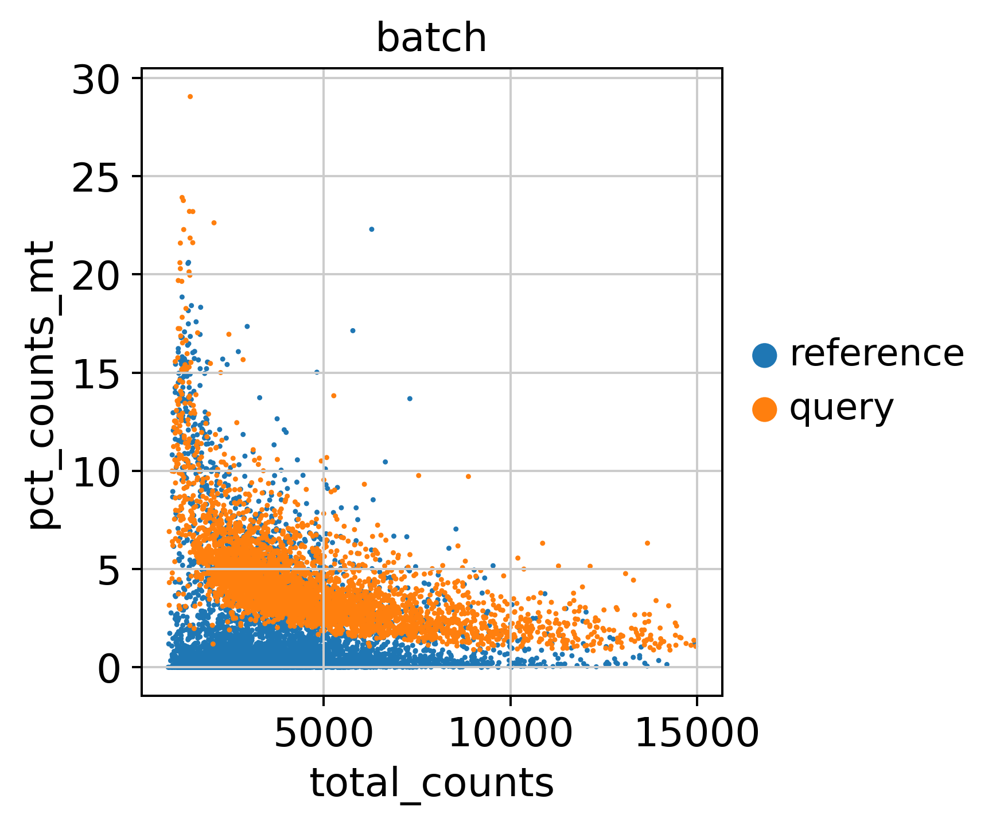

In [15]:
sc.pl.scatter(adata, x = 'total_counts', y = 'pct_counts_mt', color = "batch", frameon = False)

In [16]:
adata.obs['genotype'].value_counts()

genotype
Mdx        4554
MdxSCID    3868
WT          955
Name: count, dtype: int64

In [17]:
adata.obs['sample'].value_counts()

sample
B1_2     2968
A11_2    2549
A12_2    2005
B2_2      900
A10_2     490
A9_2      465
Name: count, dtype: int64

### Select HVGs

In [18]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 1500,
    layer = "counts",
    batch_key = "sample",
    subset = True
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 9377 × 1500
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'batch_colors', 'hvg'
    layers: 'counts'

### Transfer of annotation with scANVI

In [19]:
scvi.model.SCVI.setup_anndata(adata,
                              batch_key = "sample", 
                            categorical_covariate_keys = ["sample"], 
                            labels_key = "seed_labels", 
                            layer = 'counts')

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [20]:
scvi_model = scvi.model.SCVI(adata, 
                             n_latent = 50, 
                             n_layers = 3, 
                             dispersion = 'gene-batch', 
                             gene_likelihood = 'nb')

In [21]:
scvi_model.train(30, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices= [0])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 30/30: 100%|██████████| 30/30 [00:11<00:00,  2.97it/s, v_num=1, train_loss_step=1.5e+3, train_loss_epoch=1.49e+3] 

`Trainer.fit` stopped: `max_epochs=30` reached.


Epoch 30/30: 100%|██████████| 30/30 [00:11<00:00,  2.68it/s, v_num=1, train_loss_step=1.5e+3, train_loss_epoch=1.49e+3]


In [22]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

### Evaluate model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

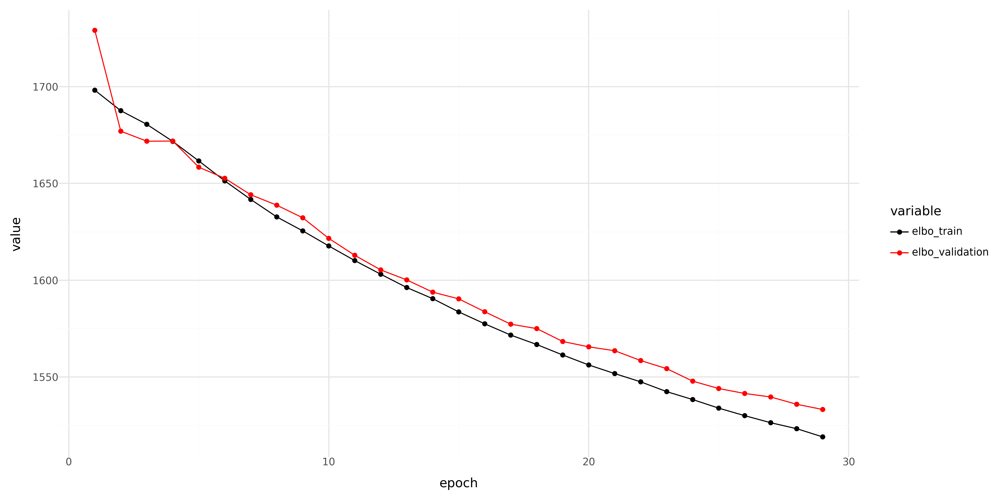

In [23]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Label transfer with `scANVI` 

In [24]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [25]:
scanvi_model.train(100, 
                   check_val_every_n_epoch = 1, 
                   enable_progress_bar = True, 
                   accelerator = 'gpu',
                   devices = [0])

INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 100/100: 100%|██████████| 100/100 [01:23<00:00,  1.36it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.41e+3]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [01:23<00:00,  1.20it/s, v_num=1, train_loss_step=1.41e+3, train_loss_epoch=1.41e+3]


In [26]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [27]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

### Explore model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

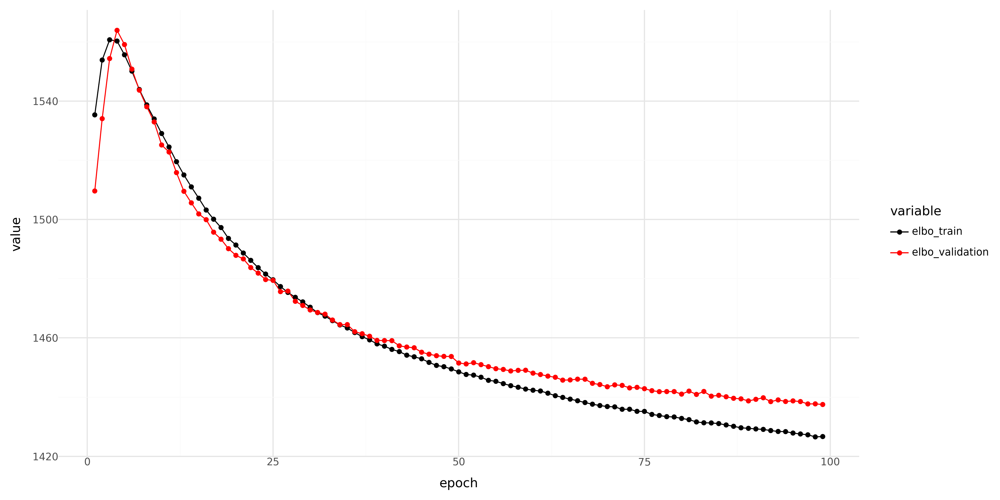

In [28]:
history_df = (
    scanvi_model.history['elbo_train'].astype(float)
    .join(scanvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

- Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


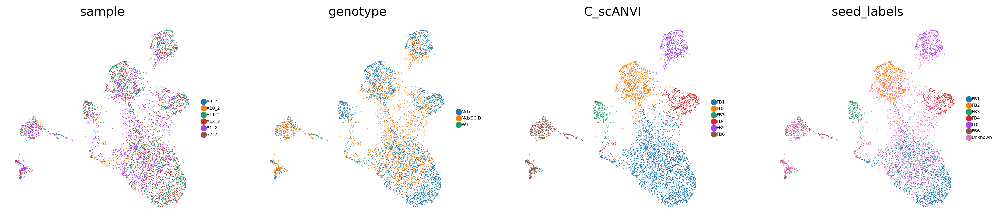

In [29]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 3, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['sample', 'genotype', 'C_scANVI', 'seed_labels'], size = 2, legend_fontsize = 5, ncols = 4)

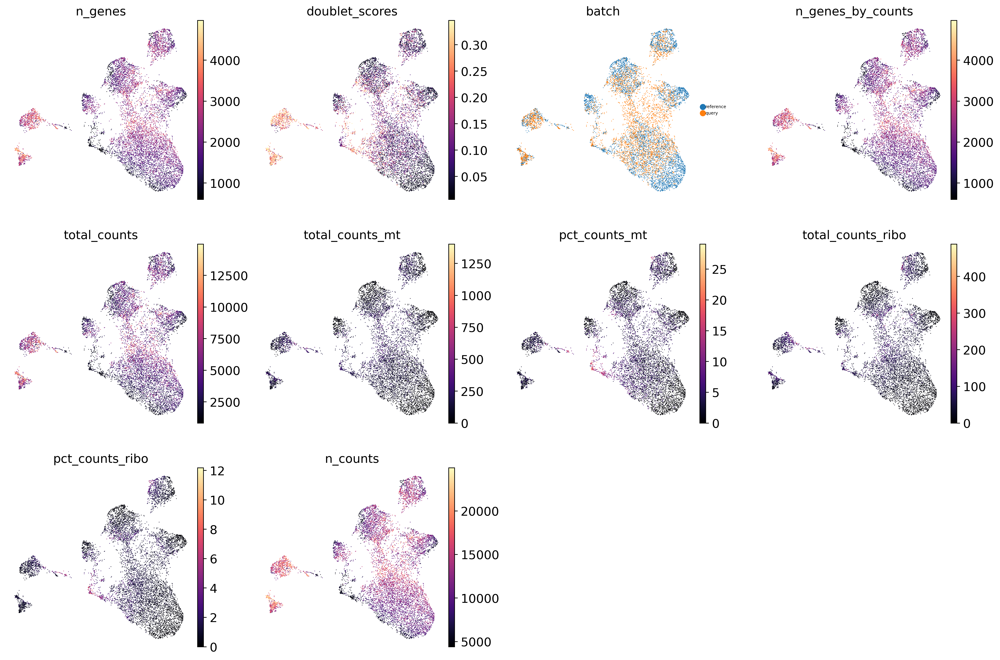

In [30]:
sc.pl.umap(adata, frameon = False, color = ['n_genes', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts'], size = 2.5, legend_fontsize = 5, ncols = 4, cmap = 'magma')

### Modify object to plot canonical marker genes

In [31]:
adata_toplot = anndata.AnnData(X = np.sqrt(sc.pp.normalize_total(adata_raw, inplace = False)["X"]), var = adata_raw.var, obs = adata.obs, obsm = adata.obsm)
adata_toplot

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 9377 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: '_scvi_extra_categorical_covs', 'X_scVI', 'X_scANVI', 'X_umap'

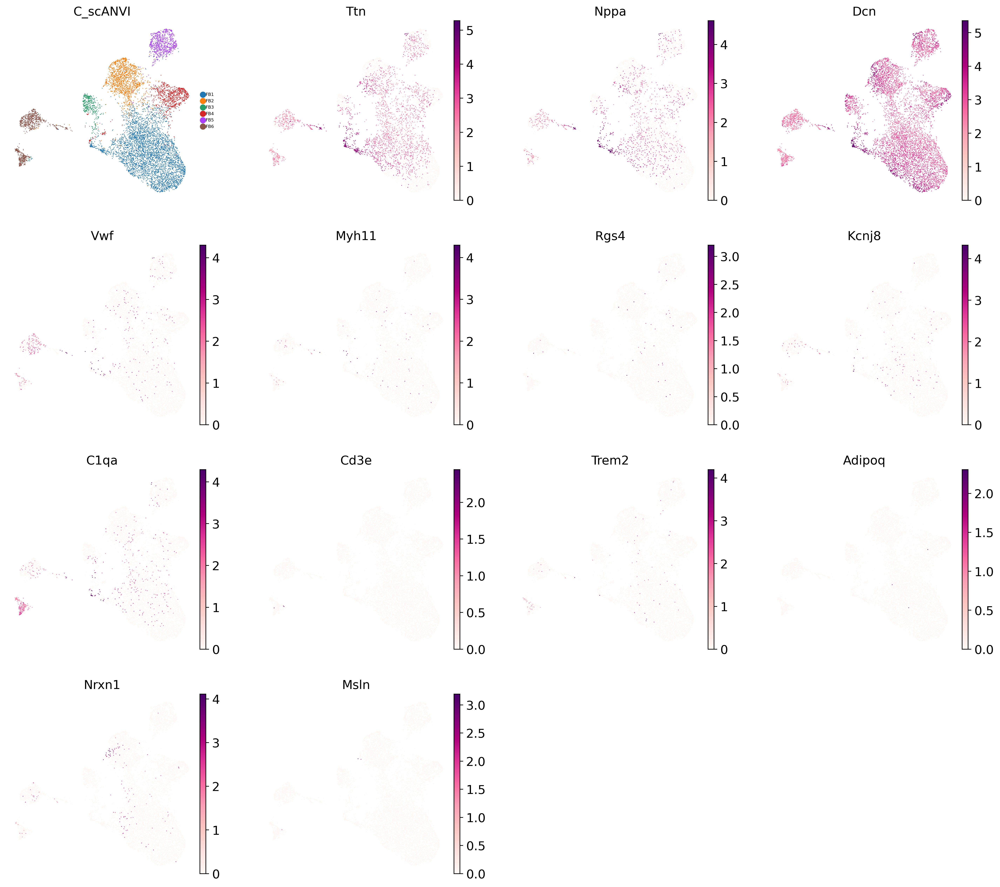

In [32]:
sc.pl.umap(adata_toplot, frameon = False, color = ['C_scANVI', 'Ttn', 'Nppa', 'Dcn', 'Vwf', 'Myh11', 'Rgs4', 'Kcnj8', 'C1qa', 'Cd3e', 'Trem2', 'Adipoq', 'Nrxn1', 'Msln'], size = 2.5, legend_fontsize = 5, ncols = 4, cmap = 'RdPu')

### Visualise proportions

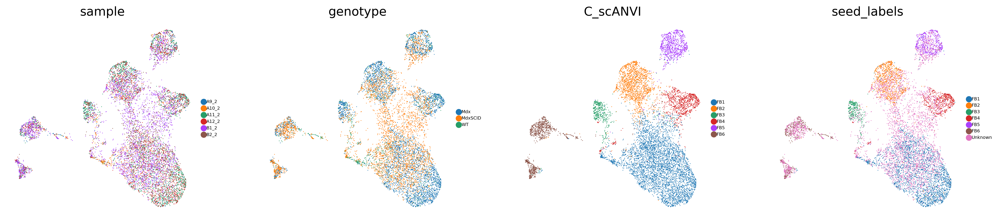

In [33]:
sc.pl.umap(adata, frameon = False, color = ['sample', 'genotype', 'C_scANVI', 'seed_labels'], size = 2.5, legend_fontsize = 5, ncols = 4)

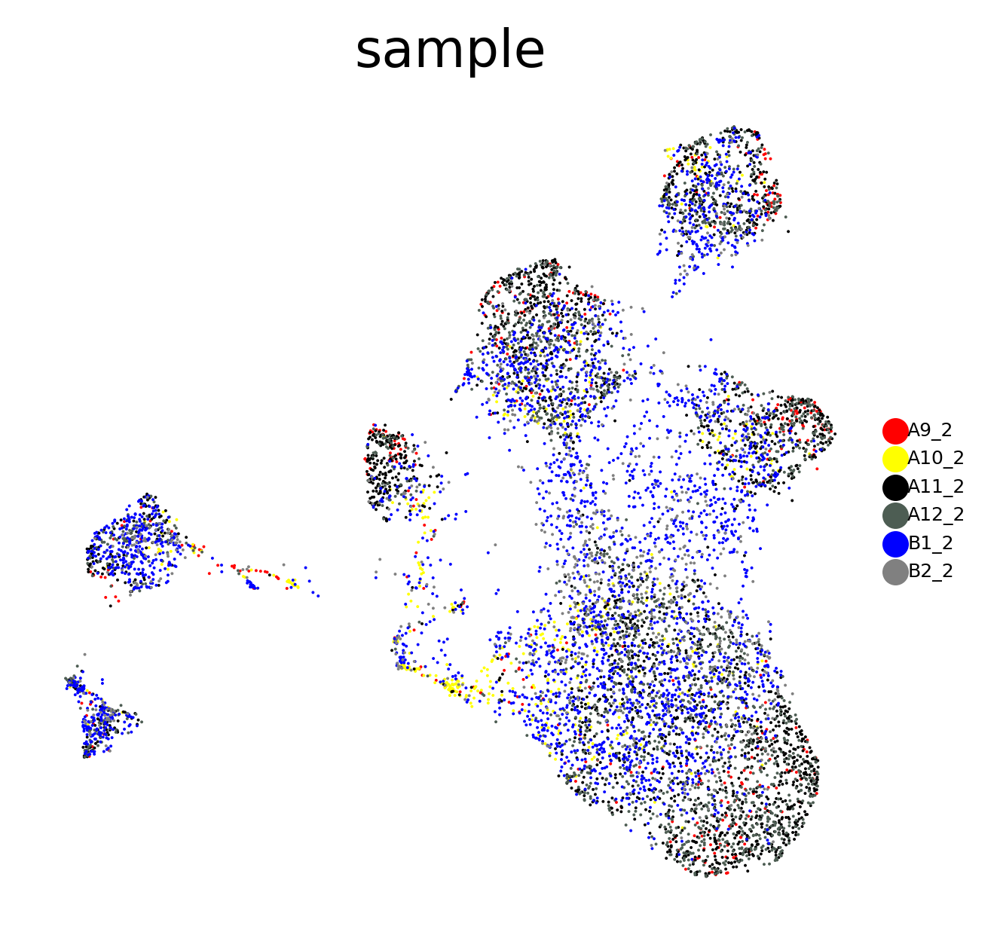

In [34]:
bauhaus_colors = ['#FF0000', '#FFFF00', '#000000', '#4D5D53', '#0000FF', '#808080']
sc.pl.umap(adata, frameon = False, color = ['sample'], size = 2.5, legend_fontsize = 5, ncols = 4, palette = bauhaus_colors)

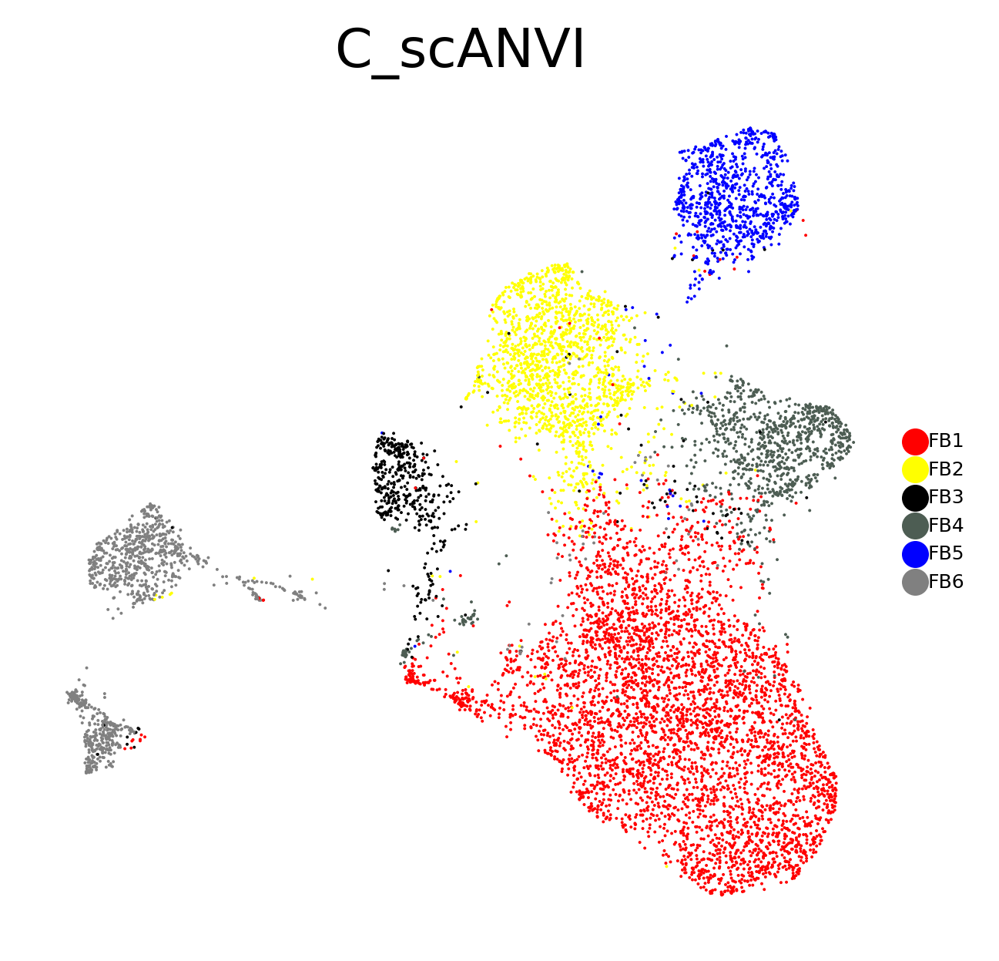

In [35]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI'], size = 2.5, legend_fontsize = 5, ncols = 4, palette = bauhaus_colors)

In [36]:
df = adata_toplot.obs.groupby(['genotype', 'C_scANVI']).size().reset_index(name = 'counts')

grouped = df.groupby('genotype')['counts'].apply(lambda x: x / x.sum() * 100)
grouped = grouped.reset_index()

df['proportions'] = grouped['counts']
df['waffle_counts'] = (df['proportions'] * 10).astype(int)

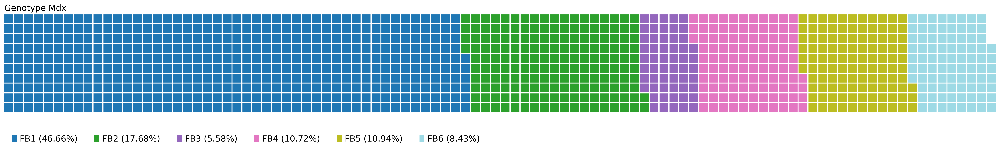

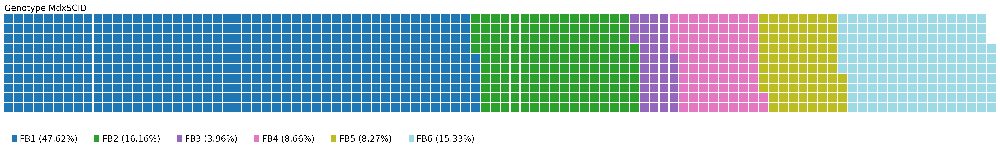

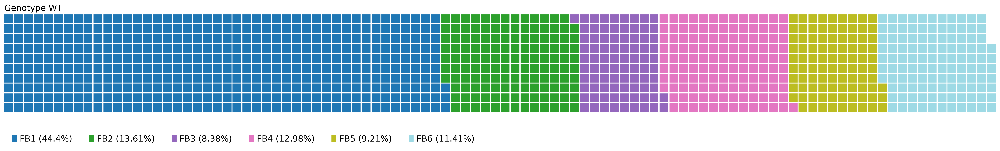

In [37]:
tab20_palette = plt.cm.get_cmap('tab20', len(df['C_scANVI'].unique()))


for group in df['genotype'].unique():
    temp_df = df[df['genotype'] == group]
    
    data = dict(zip(temp_df['C_scANVI'], temp_df['waffle_counts']))
    colors = [tab20_palette(i) for i in range(len(temp_df['C_scANVI']))]
    fig = plt.figure(
        FigureClass = Waffle, 
        rows = 10, 
        values = data, 
        title = {'label': f'Genotype {group}', 'loc': 'left', 'fontsize': 14},
        labels = [f"{k} ({v}%)" for k, v in zip(temp_df['C_scANVI'], temp_df['proportions'].round(2))],
        #legend = {'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0},
        legend = {'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0, 'fontsize': 14},
        figsize = (40, 4),
        colors = colors
    )
    plt.show()

### Export annotated sample object 

In [38]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs.index

Index(['TCGCAGGAGGCTTCCG-1-A9_2', 'CCGTTCACAAATTGCC-1-A9_2',
       'CCAAGCGGTTTCGTAG-1-A9_2', 'AACGGGACACTCAAGT-1-A9_2',
       'GGAATGGAGACAACAT-1-A9_2', 'CAGGGCTCAGCATCTA-1-A9_2',
       'AGATAGACACATTCTT-1-A9_2', 'ATCAGGTAGAGAGCCT-1-A9_2',
       'CCTCCAAAGACGGATC-1-A9_2', 'TACCTCGTCGTTAGAC-1-A9_2',
       ...
       'GGACGTCAGTACCCTA-1-B2_2', 'CATTGAGGTATGAAGT-1-B2_2',
       'CTGAATGTCAAACTGC-1-B2_2', 'AAAGAACTCAATCCGA-1-B2_2',
       'GTCCCATAGCATCCCG-1-B2_2', 'GCTGAATGTTCCAAAC-1-B2_2',
       'GAGATGGTCAGCAATC-1-B2_2', 'TATTGGGGTAAGTTAG-1-B2_2',
       'TGCAGTACATATTCGG-1-B2_2', 'GGCTTTCGTTAAAGTG-1-B2_2'],
      dtype='object', length=9377)

In [39]:
adata_raw.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata_raw.obs.index])
adata_raw.obs.index

Index(['TCGCAGGAGGCTTCCG-1-A9_2', 'CCGTTCACAAATTGCC-1-A9_2',
       'CCAAGCGGTTTCGTAG-1-A9_2', 'AACGGGACACTCAAGT-1-A9_2',
       'GGAATGGAGACAACAT-1-A9_2', 'CAGGGCTCAGCATCTA-1-A9_2',
       'AGATAGACACATTCTT-1-A9_2', 'ATCAGGTAGAGAGCCT-1-A9_2',
       'CCTCCAAAGACGGATC-1-A9_2', 'TACCTCGTCGTTAGAC-1-A9_2',
       ...
       'GGACGTCAGTACCCTA-1-B2_2', 'CATTGAGGTATGAAGT-1-B2_2',
       'CTGAATGTCAAACTGC-1-B2_2', 'AAAGAACTCAATCCGA-1-B2_2',
       'GTCCCATAGCATCCCG-1-B2_2', 'GCTGAATGTTCCAAAC-1-B2_2',
       'GAGATGGTCAGCAATC-1-B2_2', 'TATTGGGGTAAGTTAG-1-B2_2',
       'TGCAGTACATATTCGG-1-B2_2', 'GGCTTTCGTTAAAGTG-1-B2_2'],
      dtype='object', length=9377)

In [40]:
adata.obs_names

Index(['TCGCAGGAGGCTTCCG-1-A9_2', 'CCGTTCACAAATTGCC-1-A9_2',
       'CCAAGCGGTTTCGTAG-1-A9_2', 'AACGGGACACTCAAGT-1-A9_2',
       'GGAATGGAGACAACAT-1-A9_2', 'CAGGGCTCAGCATCTA-1-A9_2',
       'AGATAGACACATTCTT-1-A9_2', 'ATCAGGTAGAGAGCCT-1-A9_2',
       'CCTCCAAAGACGGATC-1-A9_2', 'TACCTCGTCGTTAGAC-1-A9_2',
       ...
       'GGACGTCAGTACCCTA-1-B2_2', 'CATTGAGGTATGAAGT-1-B2_2',
       'CTGAATGTCAAACTGC-1-B2_2', 'AAAGAACTCAATCCGA-1-B2_2',
       'GTCCCATAGCATCCCG-1-B2_2', 'GCTGAATGTTCCAAAC-1-B2_2',
       'GAGATGGTCAGCAATC-1-B2_2', 'TATTGGGGTAAGTTAG-1-B2_2',
       'TGCAGTACATATTCGG-1-B2_2', 'GGCTTTCGTTAAAGTG-1-B2_2'],
      dtype='object', length=9377)

In [41]:
adata.obs['C_scANVI'].cat.categories

Index(['FB1', 'FB2', 'FB3', 'FB4', 'FB5', 'FB6'], dtype='object')

In [42]:
adata.obs['C_scANVI'].value_counts()

C_scANVI
FB1    4391
FB2    1560
FB6    1086
FB4     947
FB5     906
FB3     487
Name: count, dtype: int64

### Export annotated object with raw counts

In [43]:
adata

AnnData object with n_obs × n_vars = 9377 × 1500
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'batch_colors', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'sample_colors', 'genotype_colors', 'C_scANVI_colors', 'seed_labels_colors'
    obsm: '_scvi_extra_categorical_covs', 'X_scVI', 'X_scANVI', 'X_umap'
    layers: 'counts'
    obsp: 

In [44]:
adata_raw

AnnData object with n_obs × n_vars = 9377 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors'

In [45]:
adata_export = anndata.AnnData(X = adata_raw.X, obs = adata.obs, var = adata_raw.var)
adata_export.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_export.obsm['X_umap'] = adata.obsm['X_umap'].copy()
adata_export.obsm['X_scANVI'] = adata.obsm['X_scANVI'].copy()
adata_export

AnnData object with n_obs × n_vars = 9377 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scVI', 'X_umap', 'X_scANVI'

In [46]:
X_is_raw(adata_export)

False